In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

In [2]:
images = []
labels = []
root_path = "ADNI"
for subfolder in tqdm(os.listdir(root_path)):
    subfolder_path = os.path.join(root_path, subfolder)
    for folder in os.listdir(subfolder_path):
        image_path=os.path.join(subfolder_path,folder)
        images.append(image_path)
        labels.append(subfolder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 61.17it/s]


,image,label
0,ADNI\AD\00046ff7-0fae-4796-9a2b-2df47095bfe6.jpg,AD
1,ADNI\AD\000cdcc4-3e54-4034-a538-203c8047b564.jpg,AD
2,ADNI\AD\0013ad52-8398-4892-9fde-060eb1ae956d.jpg,AD
3,ADNI\AD\0015bdfc-2059-4195-8eff-9c5cf2e2c025.jpg,AD
4,ADNI\AD\001f15e8-6ad4-4e7a-bc36-b62b984dad69.jpg,AD
...,...,...
4495,ADNI\MCI\15bc71fc-8db2-4f32-9adf-26a177285d56.jpg,MCI
4496,ADNI\MCI\15d06ba2-8d76-4587-be30-e985166a231c.jpg,MCI
4497,ADNI\MCI\15d1298f-473a-404a-a7c8-072587b5eaba.jpg,MCI
4498,ADNI\MCI\15d2581d-f34a-402d-90ec-d3f91f31adb9.jpg,MCI


C:\Users\new\AppData\Local\Temp\ipykernel_2364\4095864232.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=df.label,palette='Set1')


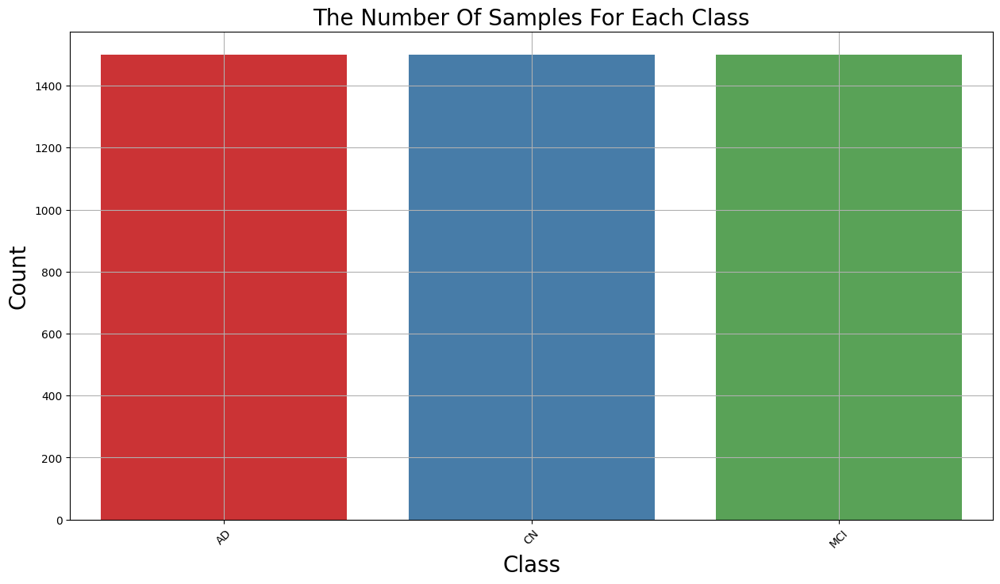

In [3]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

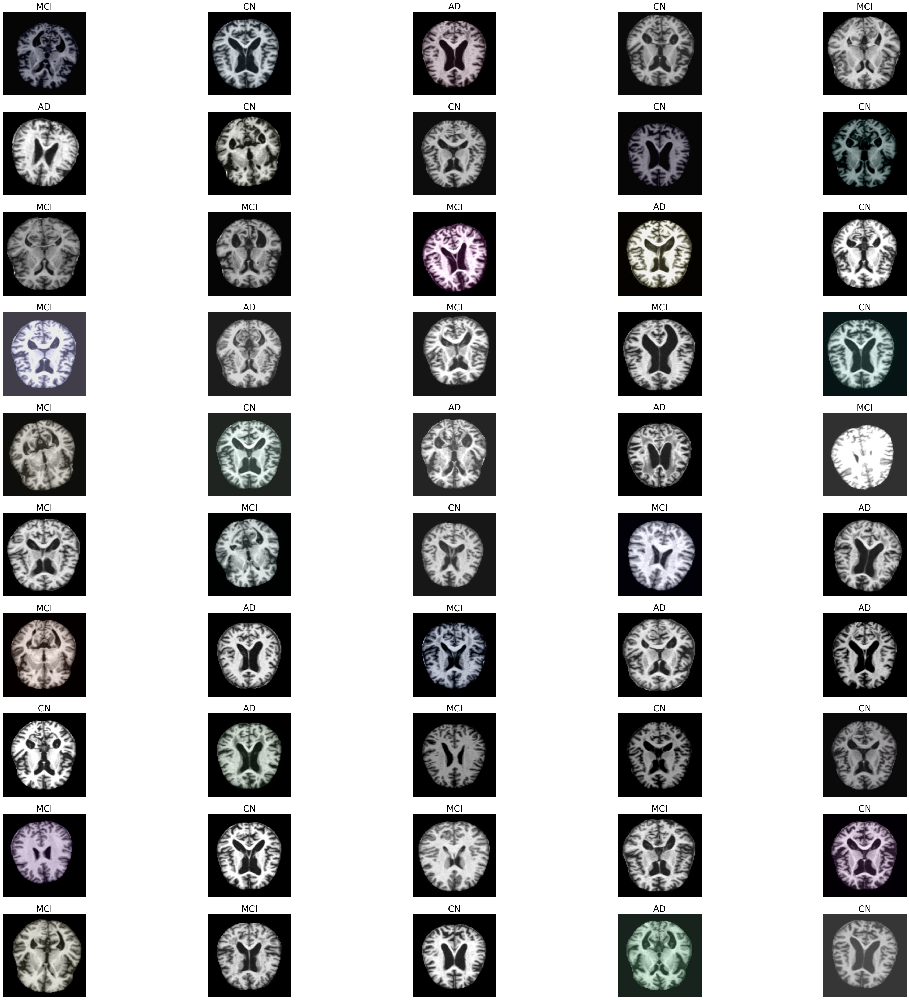

In [4]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

In [5]:
Size=(176,176)
work_dr = ImageDataGenerator(
    rescale = 1./255
)
train_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=10000, shuffle=False)

Found 4500 validated image filenames belonging to 3 classes.


In [6]:
train_data, train_labels = next(train_data_gen)

In [7]:
class_num=list(train_data_gen.class_indices.keys())
print(class_num)

['AD', 'CN', 'MCI']


In [8]:
sm = SMOTE(random_state=42)
train_data, train_labels = sm.fit_resample(train_data.reshape(-1, 176 * 176 * 3), train_labels)
train_data = train_data.reshape(-1, 176,176, 3)
print(train_data.shape, train_labels.shape)

(4500, 176, 176, 3) (4500, 3)


C:\Users\new\AppData\Local\Temp\ipykernel_2364\1034950569.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=labels,palette='Set1')


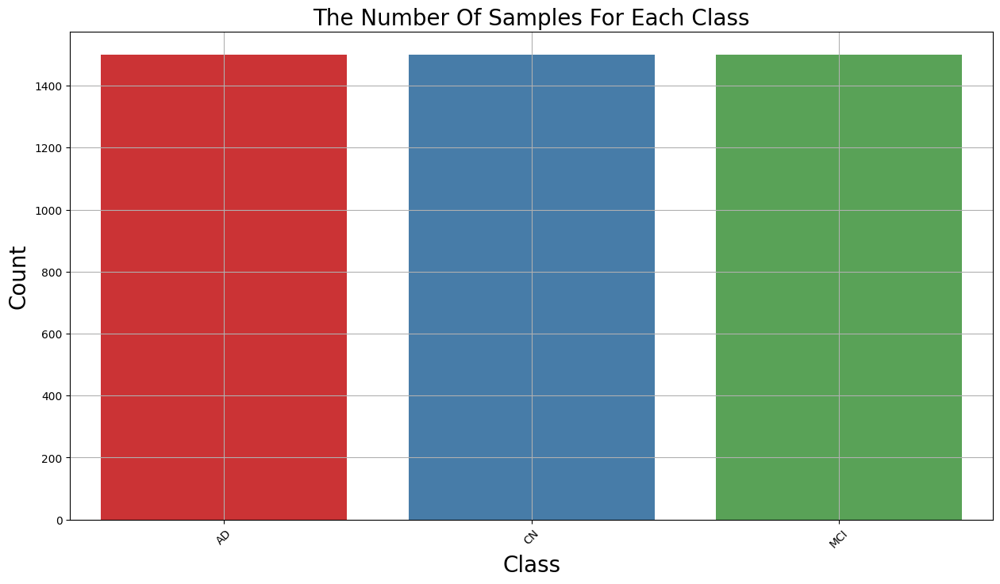

In [9]:
labels=[class_num[i] for i in np.argmax(train_labels,axis=1) ]
plt.figure(figsize=(15,8))
ax = sns.countplot(x=labels,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [10]:
X_train, X_test1, y_train, y_test1 = train_test_split(train_data,train_labels, test_size=0.3, random_state=42,shuffle=True,stratify=train_labels)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('X_val shape is ' , X_val.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)
print('y_val shape is ' , y_val.shape)

X_train shape is  (3150, 176, 176, 3)
X_test shape is  (675, 176, 176, 3)
X_val shape is  (675, 176, 176, 3)
y_train shape is  (3150, 3)
y_test shape is  (675, 3)
y_val shape is  (675, 3)


In [11]:
model=keras.models.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
model.add(keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Conv2D(128,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(1024,activation='relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(3,activation='softmax'))
model.summary()

C:\Users\new\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 88, 88, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 44, 44, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 22, 22, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 11, 11, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 6, 6, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │       1,180,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │           3,075 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,276,995 (4.87 MB)

 Trainable params: 1,276,995 (4.87 MB)

 Non-trainable params: 0 (0.00 B)

In [12]:
checkpoint_cb =ModelCheckpoint("CNN_model.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(X_train,y_train, epochs=50, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - accuracy: 0.4001 - loss: 1.0747 - val_accuracy: 0.6622 - val_loss: 0.7923
Epoch 2/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - accuracy: 0.6672 - loss: 0.7486 - val_accuracy: 0.6607 - val_loss: 0.6656
Epoch 3/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - accuracy: 0.7265 - loss: 0.5835 - val_accuracy: 0.7644 - val_loss: 0.5059
Epoch 4/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - accuracy: 0.7955 - loss: 0.4385 - val_accuracy: 0.7630 - val_loss: 0.4927
Epoch 5/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8421 - loss: 0.3542 - val_accuracy: 0.7956 - val_loss: 0.4609
Epoch 6/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - accuracy: 0.8743 - loss: 0.3014 - val_accuracy: 0.7881 - val_loss: 0.4771
Epoch 7/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - accuracy: 0.8853 - loss: 0.2683 - val_accuracy: 0.8133 - val_loss: 0.4486
Epoch 8/50
99/99 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9171 - loss: 0.2068 - val_accuracy: 0.8

In [13]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.460000,1.017208,0.662222,0.792275
1,0.689841,0.692170,0.660741,0.665611
2,0.754286,0.527171,0.764444,0.505897
3,0.799683,0.439230,0.762963,0.492661
4,0.826032,0.379840,0.795556,0.460878
5,0.866032,0.306837,0.788148,0.477147
6,0.884762,0.268051,0.813333,0.448572
7,0.911429,0.211447,0.802963,0.540071
8,0.932698,0.176698,0.816296,0.490711
9,0.944762,0.142992,0.782222,0.610892


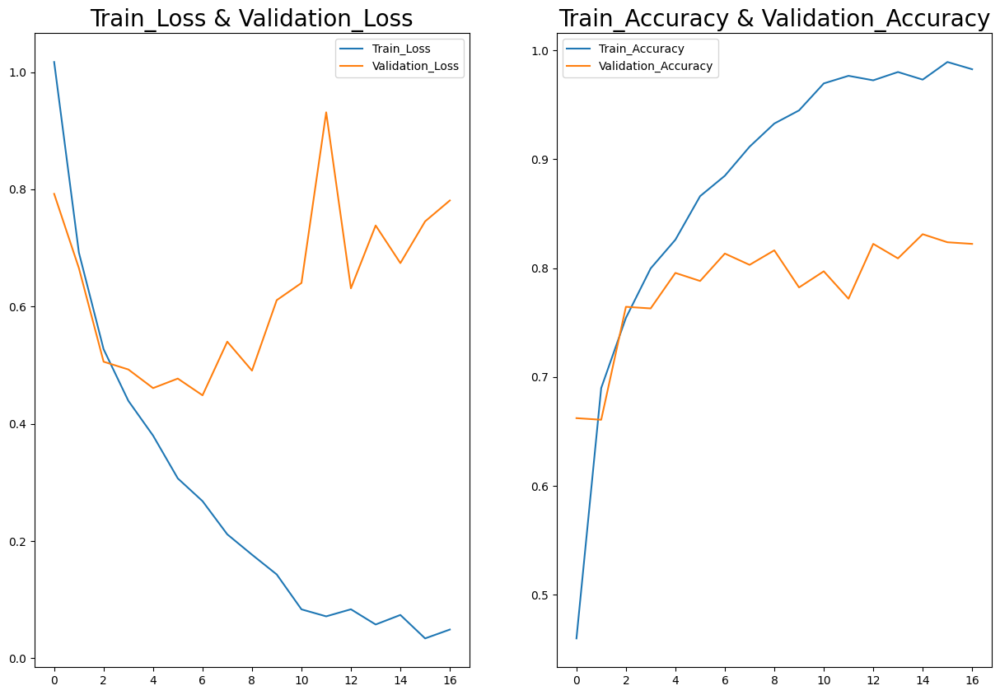

In [14]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [15]:
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.8034 - loss: 0.4142
Test Loss = 0.4389735758304596
Test Accuracy = 0.7985185384750366


In [16]:
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step


,Actual,Prediction
0,1,0
1,1,1
2,2,2
3,2,2
4,1,1
...,...,...
670,0,0
671,1,1
672,2,2
673,2,2


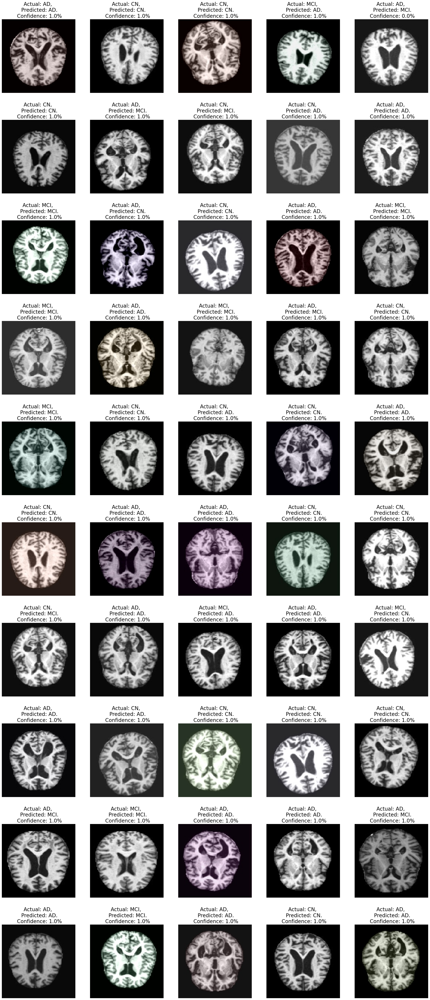

In [17]:
plt.figure(figsize=(30,70))
for n,i in enumerate(np.random.randint(0,len(X_test),50)):
    plt.subplot(10,5,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"Actual: {class_num[y_test_[i]]}, \n Predicted: {class_num[y_pred[i]]}.\n Confidence: {round(predictions[i][np.argmax(predictions[i])],0)}%",fontsize=20)

array([[152,  11,  62],
       [ 11, 211,   3],
       [ 43,   6, 176]], dtype=int64)

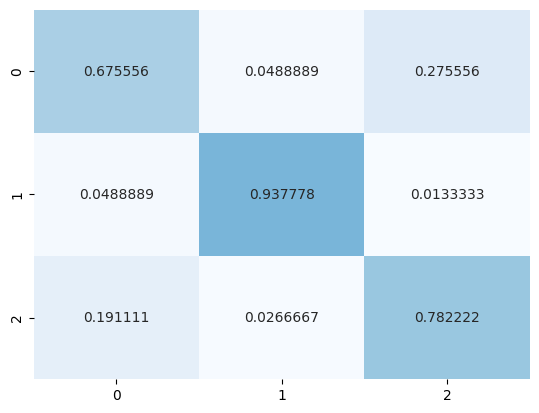

In [18]:
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [19]:
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.74      0.68      0.71       225
           1       0.93      0.94      0.93       225
           2       0.73      0.78      0.76       225

    accuracy                           0.80       675
   macro avg       0.80      0.80      0.80       675
weighted avg       0.80      0.80      0.80       675

